In [ ]:
import sys
sys.path.insert(1, '..')

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import geopandas as gpd
from pathlib import Path
import os
import numpy as np
import rasterio as rio
import rasterio.plot as rio_plot
from shapely.geometry import Point, Polygon
import shapely

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from ultralytics.utils.metrics import DetMetrics
import fiona

import matplotlib.patches as mpatches

import warnings
warnings.filterwarnings("ignore")

from matplotlib.lines import Line2D

from src.colors import *

tp_leg = mpatches.Patch(color=colors9[1], label='True positives')
fp_leg = mpatches.Patch(color=colors9[5], label='False positives')
fn_leg = mpatches.Patch(color=colors9[4], label='False negatives')
lhandles = [tp_leg, fp_leg, fn_leg]

model_path = Path('../runs/yolov8m_Adam/fold_4')
image_path = Path('../data/rgb_mosaics/')
result_dir = Path('../results_l1c/yolov8m_Adam/fold_4')
shp_path = Path('../dataset')

In [ ]:
def get_tp_fp_fn(pred_gdf:gpd.GeoDataFrame, gt_gdf:gpd.GeoDataFrame, 
                 iou_threshold:float, area_limit:gpd.GeoDataFrame=None) -> tuple[gpd.GeoDataFrame, gpd.GeoDataFrame, gpd.GeoDataFrame]:
    """
    Derive true positives, false positives and false negatives

    Args:
        pred_gdf (geopandas.GeoDataFrame): Dataframe containing polygon predictions
        gt_gdf (geopandas.GeoDataFrame): Dataframe containing ground truth polygons
        iou_threshold (float): The intersection-over-union threshold to use for matching polygons.

    Returns:
        tuple: (tp, fp, fn) geodataframes containing the true positives, false positives and false negatives
    """

    # Copy the dataframes to avoid modifying the originals
    pred_gdf_copy = pred_gdf.copy()
    gt_gdf_copy = gt_gdf.copy()
    
    if area_limit: # Clip to only contain some subarea
        pred_gdf_copy = pred_gdf_copy.clip(area_limit)
        gt_gdf_copy = gt_gdf_copy.clip(area_limit)
    
    # Count the number of true positives, false positives, and false negatives
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    tp_ixs = []
    fp_ixs = []
    for index, pred_row in pred_gdf_copy.iterrows():
        # Find the ground truth polygons that overlap with the prediction
        overlapping_gts = gt_gdf_copy[gt_gdf_copy.geometry.intersects(pred_row.geometry)]
        if overlapping_gts.empty:
            false_positives += 1
            fp_ixs.append(index)
        else:
            # Compute IoU between the prediction and overlapping ground truth polygons
            ious = overlapping_gts.geometry.intersection(pred_row.geometry).area / overlapping_gts.geometry.union(pred_row.geometry).area

            # Find the maximum IoU and corresponding index
            max_iou = np.max(ious.values)
            max_iou_index = np.argmax(ious.values)
            # If the maximum IoU is greater than the threshold, it's a true positive
            if max_iou >= iou_threshold:
                true_positives += 1
                tp_ixs.append(index)
                # Remove the matched ground truth polygon to avoid double counting
                gt_gdf_copy.drop(overlapping_gts.index[max_iou_index], inplace=True)
            else:
                false_positives += 1
                fp_ixs.append(index)

    # Any remaining ground truth polygons are false negatives
    false_negatives = gt_gdf_copy
    # Compute precision and recall
    return pred_gdf.iloc[tp_ixs], pred_gdf.iloc[fp_ixs], false_negatives

def evaluate(
    ground_truth_path:Path, # Path containing the ground truth geopackages
    result_dir:Path, # Path which contains the results
    tile:str=None, # Optional tile_id to evaluate only
    layer:str=None # Optional layer to evaluate only
):
    yolo_aps = [[],[],[],[],[],[],[],[],[],[]]
    yolo_precs =  [[],[],[],[],[],[],[],[],[],[]]
    yolo_recs =  [[],[],[],[],[],[],[],[],[],[]]
    ious = np.linspace(0.5, 0.95, 10)

    if tile is None: tiles = os.listdir(result_dir)
    else: tiles = [tile]
    for ix, i in enumerate(ious):
        tps_df = None
        fps_df = None
        tot_tp = 0
        tot_fp = 0
        tot_fn = 0
        detmetrics = DetMetrics(names={1:'boat'})
        for t in tiles:
            if layer is None:
                tsteps = fiona.listlayers(ground_truth_path/f'{t.split(".")[0]}.gpkg')
            else:
                tsteps = [layer]
            for tstep in tsteps:
                targs = gpd.read_file(ground_truth_path/f'{t}.gpkg', layer=tstep)
                preds = gpd.read_file(result_dir/t/f'{tstep}.geojson')
                tp, fp, fn = get_tp_fp_fn(preds, targs, i)
                if tps_df is None: tps_df = tp
                else: tps_df = pd.concat((tps_df, tp))
                if fps_df is None: fps_df = fp
                else: fps_df = pd.concat((fps_df, fp))
                tot_tp += len(tp)
                tot_fp += len(fp)
                tot_fn += len(fn)
        tp_ixs = np.ones((len(tps_df), 1))
        fp_ixs = np.zeros((len(fps_df),1))
        tps_for_yolo = np.concatenate((tp_ixs, fp_ixs))
        confs_for_yolo = np.concatenate((tps_df.score, fps_df.score))
        target_classes = np.ones_like(tps_for_yolo)[:,0]
        pred_classes = np.ones_like(tps_for_yolo)[:,0]
        detmetrics.process(tps_for_yolo, confs_for_yolo, target_classes, pred_classes)
        yolo_aps[ix] = detmetrics.box.ap[0]
        yolo_precs[ix] = tot_tp / (tot_tp + tot_fp)
        yolo_recs[ix] = tot_tp / (tot_tp + tot_fn)
    
    outdict = {
        'precision': yolo_precs[0],
        'recall': yolo_recs[0],
        'mAP50': yolo_aps[0],
        'mAP50-95': np.mean(yolo_aps)
    }

    return outdict

Compare the results for individual products acquired with the best individual model, `YOLOv8m_fold4`.

In [ ]:
results = evaluate(shp_path, result_dir)
results

{'precision': 0.8588661037394452,
 'recall': 0.8746928746928747,
 'mAP50': 0.8801642478550638,
 'mAP50-95': 0.4529611870353037}

# Bothnian sea

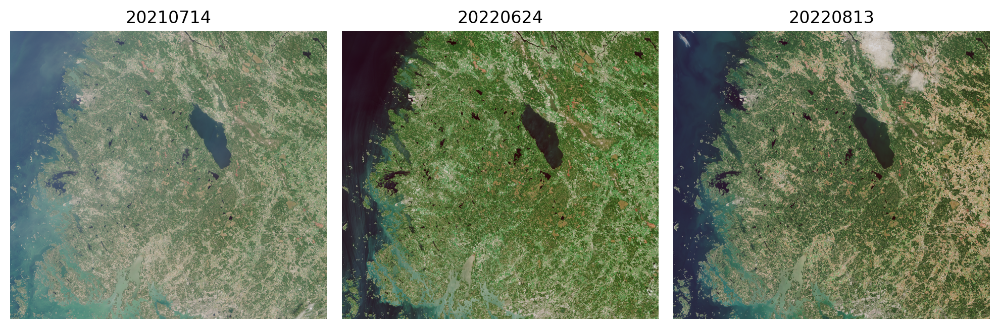

In [ ]:
archi_image_dir = image_path/'34VEN'
archi_files = os.listdir(archi_image_dir)
#| label: fig-archi-test
#| fig-cap: "Archipelago sea" 

fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(archi_files, axs):
    a.axis('off')
    with rio.open(archi_image_dir/t) as src:
        rio_plot.show(src, ax=a)
    a.set_title(f'{t[:-4]}')
plt.tight_layout()
plt.show()

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VEN')
results

{'precision': 0.8760717069368668,
 'recall': 0.8829536527886881,
 'mAP50': 0.8982520526676592,
 'mAP50-95': 0.46483866403107055}

Overall, results in the Bothnian Sea were higher than in Kvarken

Precision: 0.8793859649122807
Recall: 0.8911111111111111
mAP50: 0.9048575439959524
mAP50-95: 0.4549119284918774


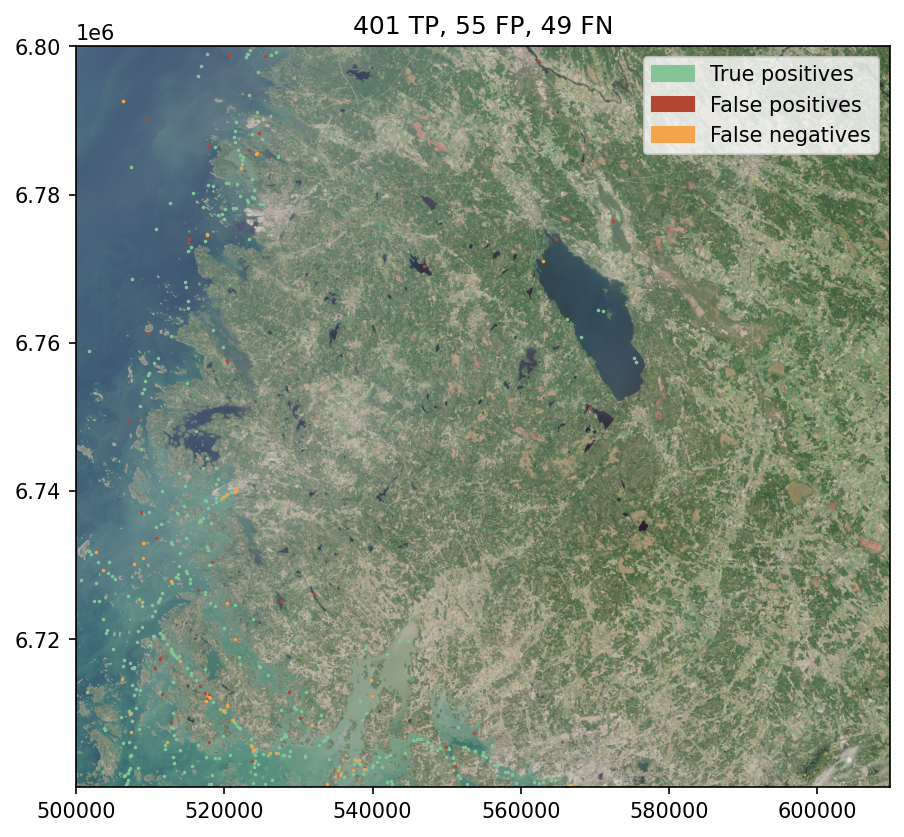

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VEN', layer=archi_files[0][:-4])
fname = archi_files[0]
targs = gpd.read_file(shp_path/'34VEN.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VEN'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(archi_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN') 
plt.show()

Precision: 0.8557919621749409
Recall: 0.8537735849056604
mAP50: 0.8798468382164418
mAP50-95: 0.45136345782934056


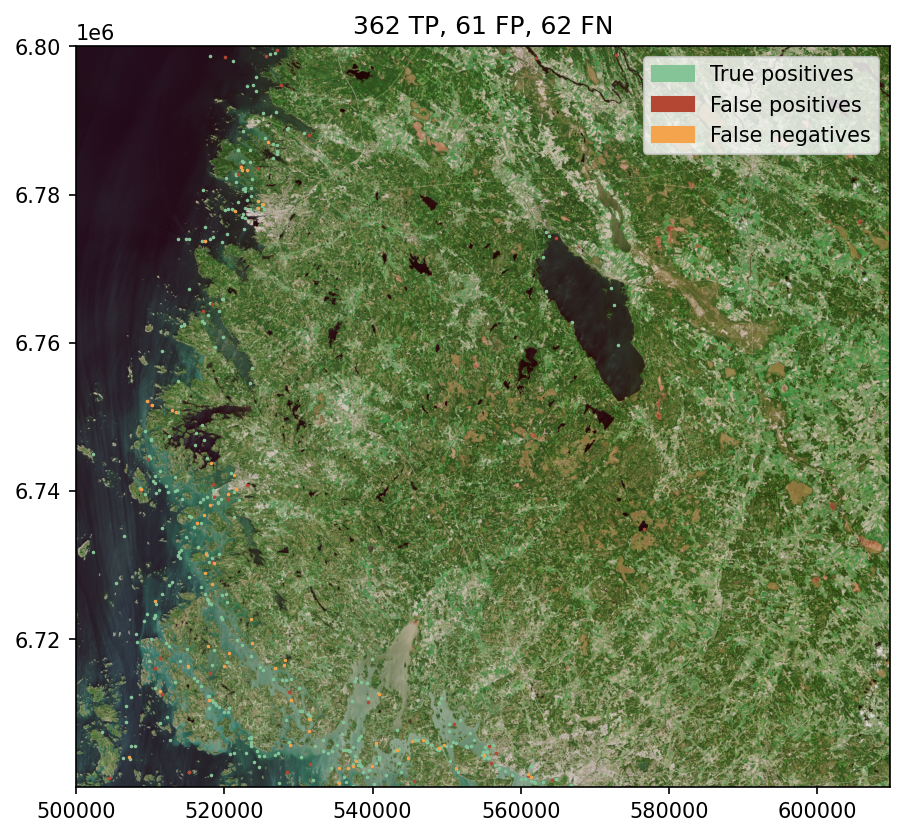

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VEN', layer=archi_files[1][:-4])
fname = archi_files[1]
targs = gpd.read_file(shp_path/'34VEN.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VEN'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(archi_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN')
plt.show()

Precision: 0.8935643564356436
Recall: 0.9047619047619048
mAP50: 0.9133811417804785
mAP50-95: 0.49604527401217924


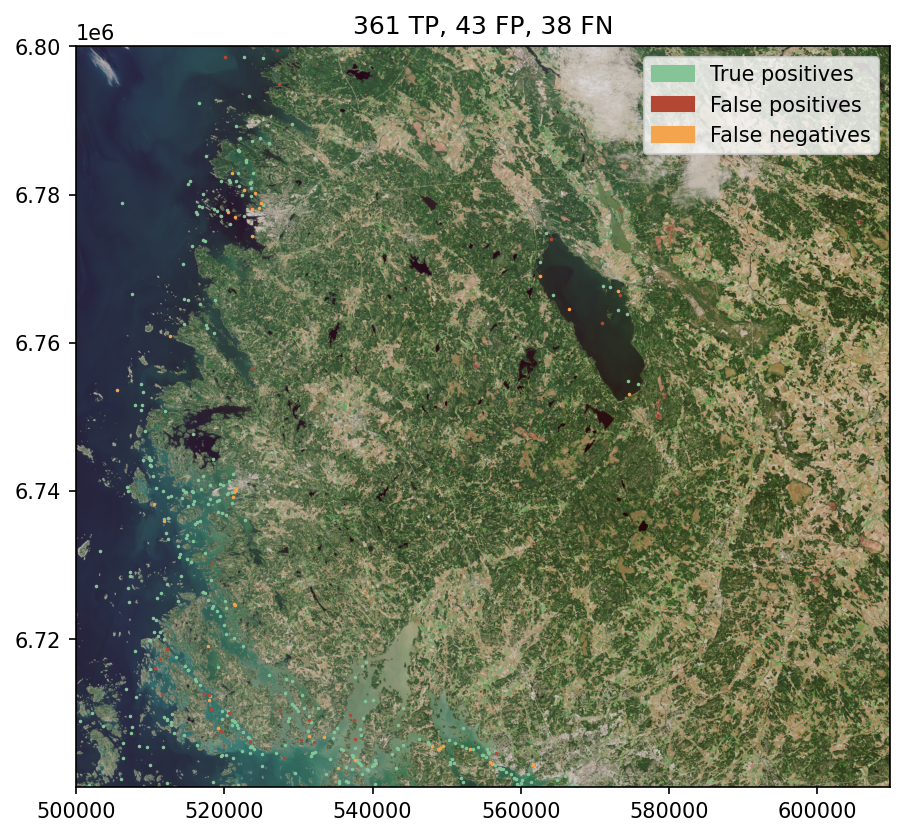

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VEN', layer=archi_files[2][:-4])
fname = archi_files[2]
targs = gpd.read_file(shp_path/'34VEN.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VEN'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(archi_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN')
plt.show()

# Kvarken

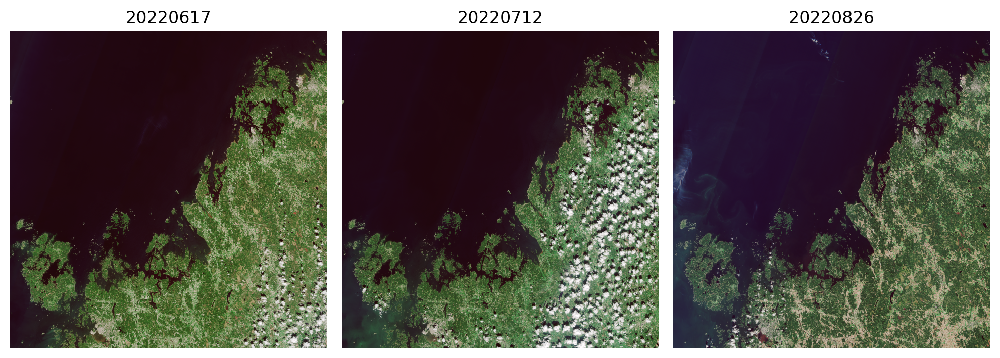

In [ ]:
kva_image_dir = image_path/'34VER'
kva_files = os.listdir(kva_image_dir)

#| label: fig-archi-test
#| fig-cap: "Archipelago sea" 

fig, axs = plt.subplots(1,3, dpi=200, figsize=(10,5))
for t, a in zip(kva_files, axs):
    a.axis('off')
    with rio.open(kva_image_dir/t) as src:
        rio_plot.show(src, ax=a)
    a.set_title(f'{t[:-4]}')
plt.tight_layout()
plt.show()

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VER')
results

{'precision': 0.8,
 'recall': 0.8450704225352113,
 'mAP50': 0.8182644085749532,
 'mAP50-95': 0.4158441741549826}

Precision: 0.8048780487804879
Recall: 0.7951807228915663
mAP50: 0.8171052034281577
mAP50-95: 0.4204982300338796


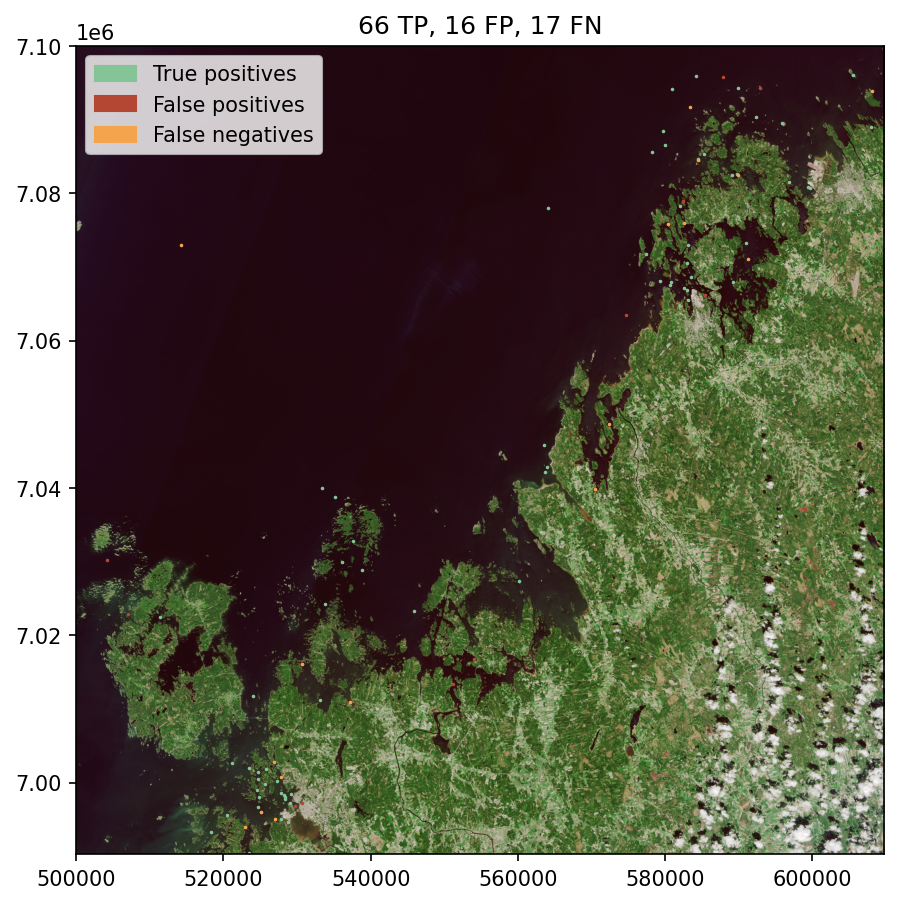

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VER', layer=kva_files[0][:-4])
fname = kva_files[0]
targs = gpd.read_file(shp_path/'34VER.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VER'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(kva_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN')
plt.show()

Precision: 0.8186528497409327
Recall: 0.8586956521739131
mAP50: 0.8372617926152419
mAP50-95: 0.42298120061016997


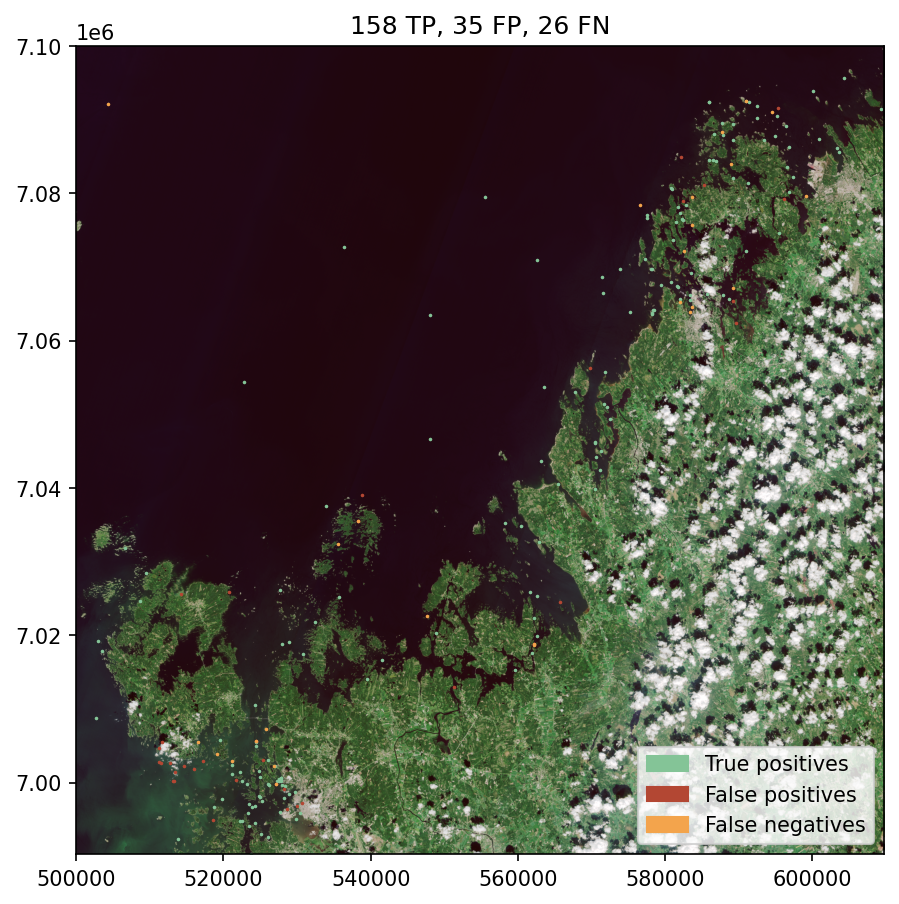

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VER', layer=kva_files[1][:-4])
fname = kva_files[1]
targs = gpd.read_file(shp_path/'34VER.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VER'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(kva_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN')
plt.show()

Precision: 0.76
Recall: 0.8636363636363636
mAP50: 0.7924646431838238
mAP50-95: 0.4130098298805803


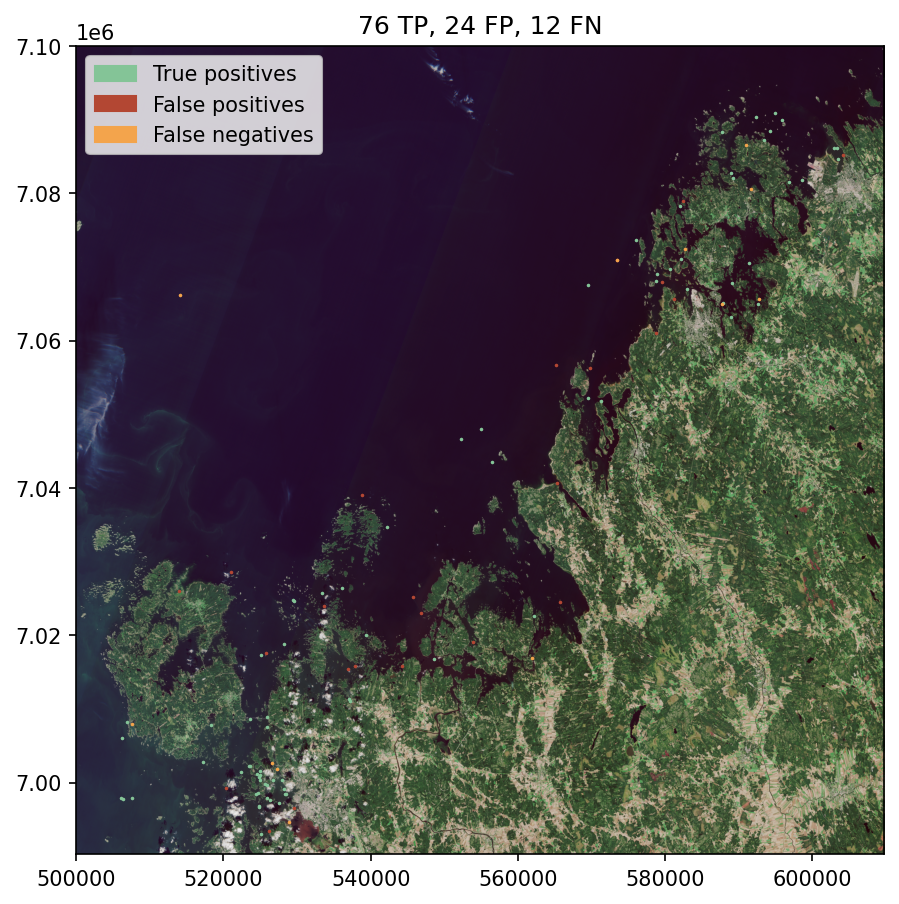

In [ ]:
results = evaluate(shp_path, result_dir, tile='34VER', layer=kva_files[2][:-4])
fname = kva_files[2]
targs = gpd.read_file(shp_path/'34VER.gpkg', layer=fname.split('.')[0])
preds = gpd.read_file(result_dir/'34VER'/fname.replace('tif', 'geojson'))
tp, fp, fn = get_tp_fp_fn(preds, targs, 0.5)
print(f'Precision: {results["precision"]}')
print(f'Recall: {results["recall"]}')
print(f'mAP50: {results["mAP50"]}')
print(f'mAP50-95: {results["mAP50-95"]}')

fig, ax = plt.subplots(1,1, dpi=150, figsize=(7,7))
with rio.open(kva_image_dir/fname) as src:
    rio_plot.show(src, ax=ax)
tp['geometry'] = tp.geometry.centroid
tp.plot(ax=ax, color=colors9[1], markersize=.5)
fp['geometry'] = fp.geometry.centroid
fp.plot(ax=ax, color=colors9[5], markersize=.5)
fn['geometry'] = fn.geometry.centroid
fn.plot(ax=ax, color=colors9[4], markersize=.5)
ax.legend(handles=lhandles)
plt.title(f'{len(tp)} TP, {len(fp)} FP, {len(fn)} FN')
plt.show()